## 0) Подгружаем необходимые библиотеки

In [2]:
# удобные структуры данных
import numpy as np
import pandas as pd

# графики
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Удобное исследование данных "из коробки"
from pandas_profiling import ProfileReport

# Для расчета расстояния между двумя точками
from math import sin, cos, sqrt, atan2, radians

# Для преобразования категориальных признаков
from sklearn.preprocessing import LabelEncoder

# Для модели
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import classification_report, accuracy_score, mean_squared_error


## 1) Загружаем данные

In [3]:
df = pd.read_csv('taxi.csv')

## 2) Смотрим на данные. Отображаем общую информацию по признакам при помощи методов: head, describe и info. 

In [4]:
df.head()

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
0,1105373,5,20,6080,174182,55.818842,37.334562,55.814567,37.355010,-1.000,-1.000,Economy,private,0
1,759733,5,14,6080,358774,55.805342,37.515023,55.819329,37.466398,18.802,25.217,Standard,private,1
2,416977,6,14,6080,866260,55.813978,37.347688,55.814827,37.354074,6.747,9.800,Economy,private,0
3,889660,2,6,6080,163522,55.745922,37.421748,55.743469,37.431130,-1.000,-1.000,Economy,private,1
4,1120055,4,16,6080,506710,55.803578,37.521602,55.812559,37.527407,12.383,19.250,Economy,private,1


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 14 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   offer_gk                100000 non-null  int64  
 1   weekday_key             100000 non-null  int64  
 2   hour_key                100000 non-null  int64  
 3   driver_gk               100000 non-null  int64  
 4   order_gk                100000 non-null  int64  
 5   driver_latitude         100000 non-null  float64
 6   driver_longitude        100000 non-null  float64
 7   origin_order_latitude   100000 non-null  float64
 8   origin_order_longitude  100000 non-null  float64
 9   distance_km             100000 non-null  float64
 10  duration_min            100000 non-null  float64
 11  offer_class_group       100000 non-null  object 
 12  ride_type_desc          100000 non-null  object 
 13  driver_response         100000 non-null  int64  
dtypes: float64(6), int64(

In [6]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
offer_gk,100000.0,566218.928650,325935.980081,4.0,285555.250000,565671.500000,848719.750000,1.130355e+06
weekday_key,100000.0,3.159860,2.054222,0.0,1.000000,3.000000,5.000000,6.000000e+00
hour_key,100000.0,13.827790,7.306496,0.0,8.000000,16.000000,20.000000,2.300000e+01
driver_gk,100000.0,3446.376360,2038.738677,14.0,1421.000000,3506.500000,5242.000000,6.806000e+03
order_gk,100000.0,460867.012910,266064.989530,18.0,229178.500000,462420.000000,690894.000000,9.203440e+05
driver_latitude,100000.0,55.700824,2.135903,-1.0,55.708651,55.772904,55.960667,5.617410e+01
driver_longitude,100000.0,37.492292,1.454640,-1.0,37.413497,37.533664,37.624113,3.828055e+01
origin_order_latitude,100000.0,55.772440,0.665985,-1.0,55.708032,55.772561,55.962000,5.631112e+01
origin_order_longitude,100000.0,37.541637,0.467758,-1.0,37.407117,37.532537,37.624358,3.824361e+01
distance_km,100000.0,18.393518,41.129296,-1.0,-1.000000,10.411500,30.665250,5.234283e+03


#### Вывод 1: Видим, что данные представленны типами признаков: количественные (метод инфо определят их как float), категориальные (как номинальные, так и порядковые), а так же бинаные - это наш целевой признак, который [jnbv научиться предсказывать.

#### Метод describe показывает как распределены признаки:
* У признака offer_gk сильно растянут левый хвост. Однако по смыслу в модели этот призак бессмысленный, так как отражает просто какой то порядковый номер предложения. 
* У признаков [driver_latitude, driver_longitude, origin_order_latitude, origin_order_longitude, distance_km, duration_min] имеются аномальные значения -1, судя по всему так заполенены неизвестные значения (пустоты)

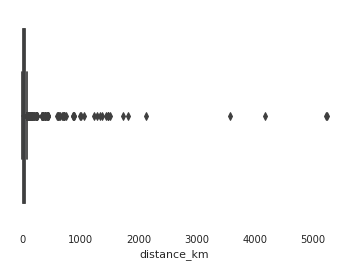

In [7]:
df1 = df[df['distance_km']!=-1]
ax = sns.boxplot(x=df1['distance_km'])

#### Признак distance_km имеет сильно выраженый правый хвост. Максимальное значение 5000 км. Такое расстояние вполне реальное растояние. Поэтомы нельзя считать эти большие значения выбросами или аномалиями. 

## 3) Выявляем пропуски, предполагаем, причины их возникновения и что с ними делать.

#### а) Смотрим сколько пропусков в признаках

In [8]:
df.isnull().sum()

offer_gk                  0
weekday_key               0
hour_key                  0
driver_gk                 0
order_gk                  0
driver_latitude           0
driver_longitude          0
origin_order_latitude     0
origin_order_longitude    0
distance_km               0
duration_min              0
offer_class_group         0
ride_type_desc            0
driver_response           0
dtype: int64

#### Пропусков нет. Однако на предыдущем шаге заметили аномальные -1 и предположили что это могут быть заполнители пропусков. И действительно координат со значеним -1 не бывает, так как и значение времени поездки и расстояния поездки.

In [9]:
df[df==-1].sum()

offer_gk                      0.0
weekday_key                   0.0
hour_key                      0.0
driver_gk                     0.0
order_gk                      0.0
driver_latitude            -140.0
driver_longitude           -140.0
origin_order_latitude       -13.0
origin_order_longitude      -13.0
distance_km              -26207.0
duration_min             -26207.0
offer_class_group             0.0
ride_type_desc                0.0
driver_response               0.0
dtype: float64

#### По количеству заполненых пропусков, видим, что координаты водителя и заказа не известны максимум в 153 случаях на выборке 100000  это незначительное количество. Сами по себе эти признаки ничего не значат и из них нужно будет искать производные более осмысленные признаки, такие как растояние между водителем и заказом, район заказа и, может быть, район водителя. Поэтому можно смело брать усредненеое значение для найденых производных признаков.

#### Пропуски в признаках distance_km и duration_min, куда более значимые. В районе 25% выборки эти признаки имеют искуственную природу заполнения. И сами показатели существенно значемые, что бы пожертвовать целым признаком. Исключать их из модели крайне не желательно. Кроме того незнание куда ехать и как долго, может влиять на результат принятия заказа таксистом. Поэтому в данные нужно ввести новый бинарный признак "известно/не известно" куда ехать. А для -1 посчитать медианное значения, так как распределение сильно растянуто в правую сторону .  

## 4) Оцениваем зависимости переменных между собой. Иследуем корреляции  с помощью profile_report.

In [3]:
profile = ProfileReport(df, title='Pandas Profiling Report', html={'style':{'full_width':True}})
#profile.to_widgets()
profile.to_notebook_iframe()

#### а) Отчет Pandas Profiling показал сильные корреляционные зависимости между признаками: driver_latitude/driver_longitude, origin_order_latitude/origin_order_longitude, distance_km/duration_min. Первые две зависимости это координаты водтеля и заказа. Ои на прямую участвовать в модели не будут, будут из производные. Третья зависимость ожидаема. Чем больше расстояние тем долше поездка. Один из признаков будет исключен из модели.

#### б) У показателей weekday_key и hour_key есть нули. Однако при исследовании на количество уникальных значений, видно, что это  категориальные порядковые признаки в числовом формате. Уже сразу готовые для моделей а основе деревьев.

#### в) Признаки: 
- driver_latitude
- driver_longitude
- origin_order_latitude
- origin_order_longitude
- distance_km
- duration_min

#### имеют сильный прекос. Это ожидаемо так, так пустоты аполнены аномальные значениями -1.

#### г) driver_response очевидных корреляционных зависимостей не имеет.



## 5) Определяем стратегию преобразования категориальных признаков.

#### На основе проведенного иследования, мы выявили котегориальые признаки, как номинальые, так и порядковые. Деревья уже готовые для работы с порядковыми категориальными признаками, так как они числовые. А вот для номинальных категориальных признаков нужны преобразование в числа. Кординальность offer_class_group и ride_type_desc не высокая, поэтому подойдет преобразование, как OneHotEncoder, так и LabelEncoder. Если бы у нас была регриссионная модель, то однозначно надо было делать OneHotEncoder, однако так как у нас дерево, вполне сойдет и LabelEncoder. Как бонус получаем меньший объем дата сета ,а следовательно и большую производительность.

## 6) Находим признаки, которые можно разделить или преобразовать на другие. Определяем какие признаки необходимо исключить из модели.

* offer_gk - кординальность 100% ценной информации по этому признаку нет. Исключаем.
* weekday_key - день недели. Ценный признак - оставляем.
* hour_key - час. Ценный признак - оставляем.
* driver_gk - номер водителя. Сам по себе признак ничего не значит. Однако если мы могли бы связать определенного водителя с источником другой полезной информации, то моглибы просегментировать водителей и у нас бы появился на его основе другой уже значимый признак. Исключаем.
* order_gk - Так же как и offer_gk имеет высокую кардинальность. Однако повторяющиеся значения есть. На этой основе можно создать какой-нибудь дополнительный ценный признак. Но не могу придумать как. Так или иначе этот признак тоже был бы исключен.
* driver_latitude/driver_longitude - координаты водителя и origin_order_latitude/origin_order_longitude - координаты водителя. Сами по себе это признаки ничего не значат. Однако на их основе можно создать несколько полезных дополнительных принаков: 
    - "район водителя" 
    - "район заказа"
    - "расстояние между водителем и заказом"
* distance_km и duration_min. Сильно коррелируемые 0,97. Один из признаков исключаем. На основе одного из признака создаем новый дополнительный бинарный признак, который будет содержать информацию о то м известно ли расстояние/время или нет. Вместо -1 заменяем на медианое значение. Хотя.... Дерево же не учитывает веса и знаки значений признаков. Может и без усреднения и нового признака, дерево поймет что к чему....
* offer_class_group - номинальный категориальный признак. Применяем LabelEncoder и оставляем в модели.
* ride_type_desc - номинальный категориальный признак. Применяем LabelEncoder и оставляем в модели.
* driver_response - целевое значение. Бинанрное. Пропусков нет. Оставляем как есть и на нем обучаем модель.

In [10]:
def distance(param):
    # approximate radius of earth in km
    R = 6373.0

    #print (param['driver_latitude'])
    lat1 = radians(param['driver_latitude'])
    lon1 = radians(param['driver_longitude'])
    lat2 = radians(param['origin_order_latitude'])
    lon2 = radians(param['origin_order_longitude'])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    return R * c


In [11]:
df['dist'] = df.apply(distance, axis=1)
df.loc[df.distance_km!=-1,'is_emp_dist']=0
df.loc[df.distance_km==-1,'is_emp_dist']=1
median_distance_km = df.loc[df.distance_km!=-1]['distance_km'].median()
df.loc[df.distance_km==-1,'distance_km']=median_distance_km
median_dist = df.loc[(df.driver_latitude!=-1)|(df.origin_order_latitude!=-1)]['dist'].median()
df.loc[(df.driver_latitude==-1)|(df.origin_order_latitude==-1),'dist']=median_dist

In [12]:
labelencoder = LabelEncoder()
df['offer_class_group_lb'] = labelencoder.fit_transform(df['offer_class_group'])
df['ride_type_desc_lb'] = labelencoder.fit_transform(df['ride_type_desc'])

In [13]:
df1= df[['weekday_key','hour_key','is_emp_dist','dist','distance_km','driver_response']]
#print(median_dist)
#df[(df.driver_latitude==-1)|(df.origin_order_latitude==-1)|(df.is_emp_dist==1)]

In [14]:
df1

,weekday_key,hour_key,is_emp_dist,dist,distance_km,driver_response
0,5,20,1.0,1.363473,18.607,0
1,5,14,0.0,3.414164,18.802,1
2,6,14,0.0,0.410128,6.747,0
3,2,6,1.0,0.647676,18.607,1
4,4,16,0.0,1.062815,12.383,1
...,...,...,...,...,...,...
99995,0,2,0.0,0.622058,17.378,0
99996,0,1,0.0,0.405554,7.751,0
99997,1,20,0.0,0.204496,46.983,0
99998,6,21,0.0,0.394038,50.029,0


## 7) Разделям выборку на обучаемую и тестовую.

In [15]:
X_train, X_test, y_train, y_test = train_test_split(df1[df1.columns.difference(['driver_response'])], df1['driver_response'], test_size=0.2, random_state=30)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(80000, 5) (20000, 5) (80000,) (20000,)


## 8) Обучаем модель. Хорошие результаты дают классификаторы RandomForest и XGBoost. Обучим модель RandomForest

In [16]:
# Создаём модель леса из сотни деревьев
model = RandomForestClassifier(n_estimators=100, 
                               bootstrap = True,
                               max_features = 'sqrt')
# Обучаем на тренировочных данных
model.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [17]:
print(classification_report(y_test, model.predict(X_test)))
print(accuracy_score(y_test, model.predict(X_test)))

              precision    recall  f1-score   support

           0       0.70      0.68      0.69     10217
           1       0.67      0.70      0.69      9783

    accuracy                           0.69     20000
   macro avg       0.69      0.69      0.69     20000
weighted avg       0.69      0.69      0.69     20000

0.68845


#### В зависимости от того, что для нас важнее точность или полнота, качество предсказания 0,67 и 0,7. Агрегированый критерий качества = 0,69 

In [18]:
modelXGB = xgb.XGBRegressor()
modelXGB.fit(X_train, y_train)
print(mean_squared_error(y_test, modelXGB.predict(X_test)))


0.18908461999182272


#### Грдиентный бустиг не классифицирующая модель. Однако по близости к 1 и 0, можно судить о принадлежности наблюдения к одному или другому классу. Оценка качества модели характеризуется среднеквадратичной ошибкой. Она равна 0,19. Самая плохая оценка качества = 1. Самая хорошая оценка качества = 0. Случайное угадывание = 0,5. Оценка качества модели равное 0,19, ближе к хорошему результату, чем простое случайное угадывание.